# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

In [ ]:
!ls ../data/imgs/arrow

vlcsnap-2020-10-21-18h01m22s212.png
vlcsnap-2020-10-21-18h01m27s294.png
vlcsnap-2020-10-21-18h01m29s941.png
vlcsnap-2020-10-21-18h01m33s362.png
vlcsnap-2020-10-21-18h01m36s056.png
vlcsnap-2020-10-21-18h01m41s874.png
vlcsnap-2020-10-21-18h01m44s163.png
vlcsnap-2020-10-21-18h01m46s644.png
vlcsnap-2020-10-21-18h01m49s487.png
vlcsnap-2020-10-21-18h01m51s638.png


In [ ]:
import numpy as np
import cv2
import time
import os
import math
import sys
import glob
from random import randrange

from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (10, 10)

### 1) Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара)

In [ ]:
images = glob.glob('../data/imgs/arrow/*.png')

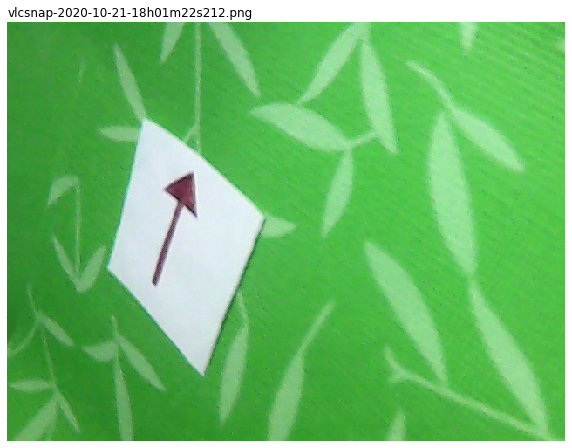

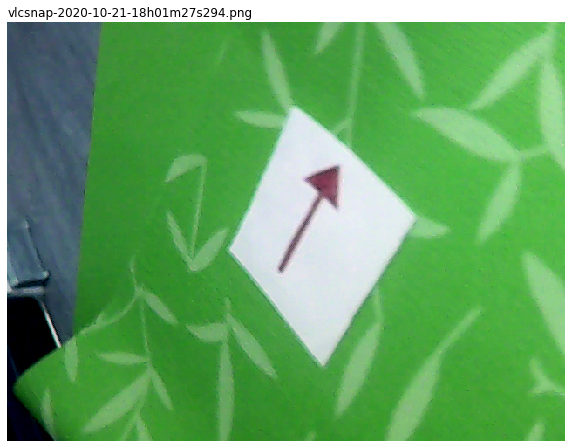

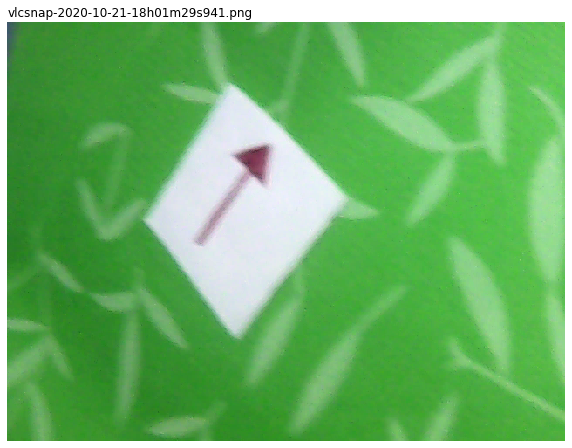

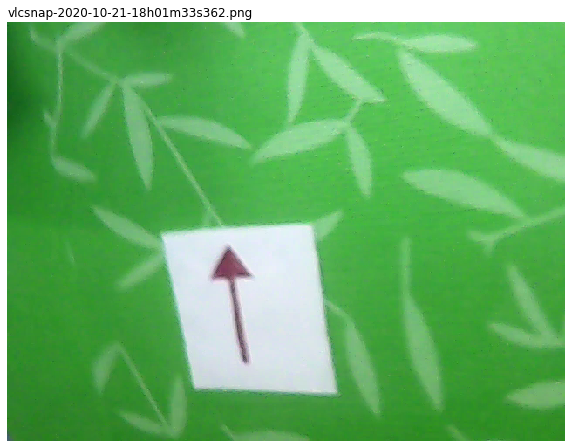

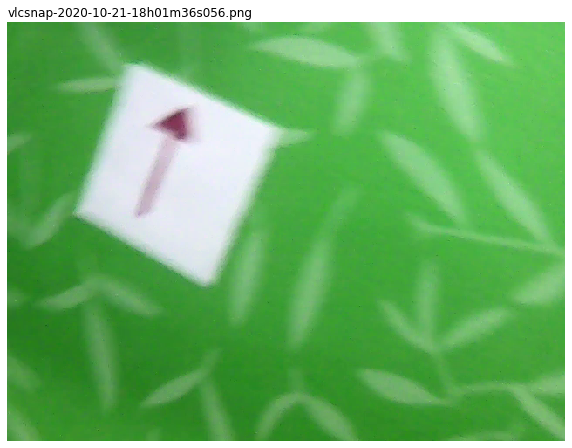

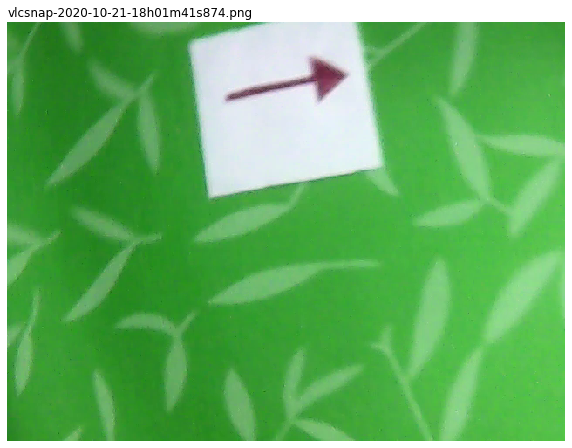

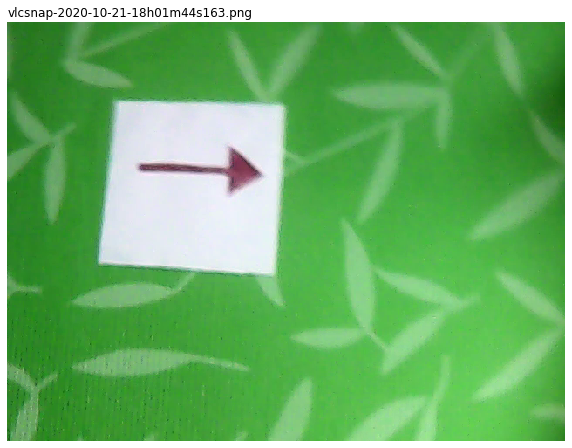

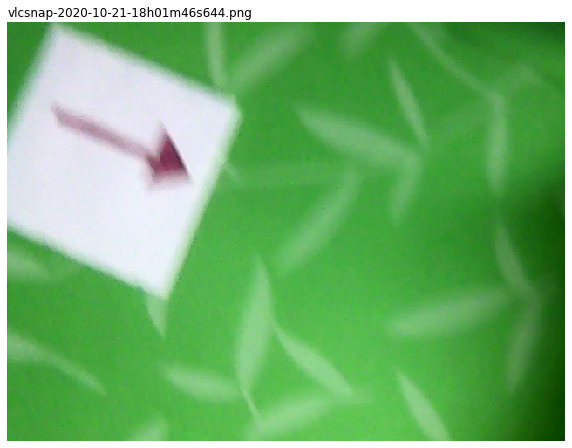

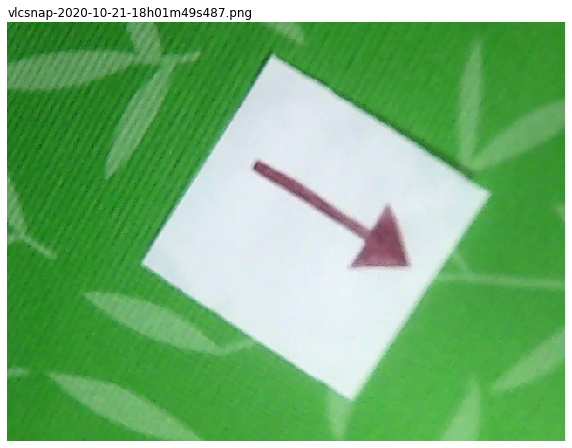

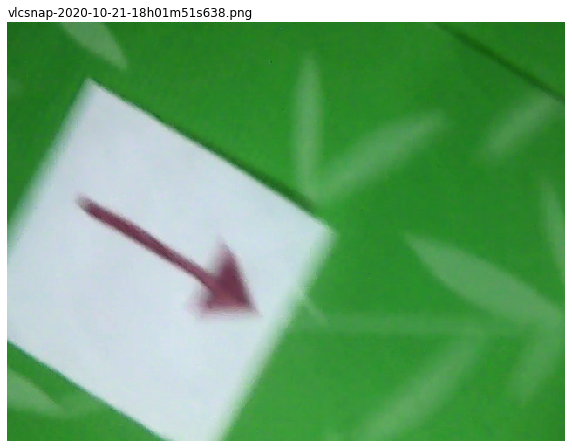

In [ ]:
for img_name in images:
    img = cv2.imread(img_name)
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(img_name), loc='left')
    plt.show()

### Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

In [ ]:
def find_contour (img, low_th, high_th):
    mask = cv2.inRange(img, low_th, high_th)
    
    contours, hierarchy = cv2.findContours (mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contoursSorted = sorted(contours, key=lambda x: cv2.contourArea(x), reverse=True)
    cnt = contoursSorted[0]

    approx = cv2.convexHull(cnt)

    epsilon = 0.05 * cv2.arcLength(approx, True)
    approx = cv2.approxPolyDP(approx, epsilon, True)

    return approx

In [ ]:
def find_distance(img):
    low_th  = (175, 175, 175)
    high_th = (255, 255, 255)

    contour = find_contour(img, low_th, high_th)
    length = cv2.arcLength(contour, True)
    distance = 180.0 * 364 / length
    return distance, contour

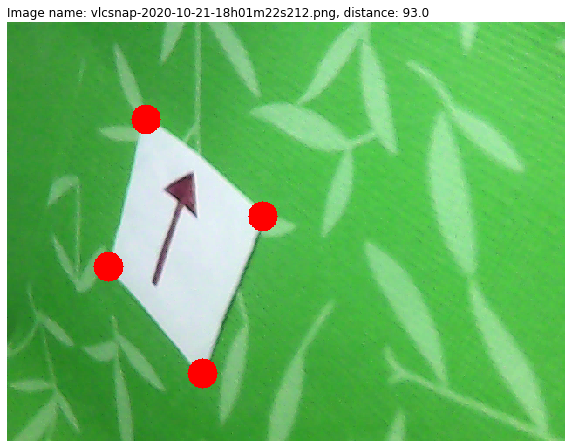

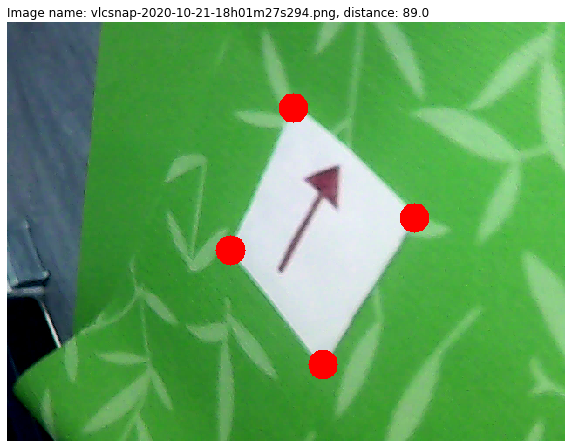

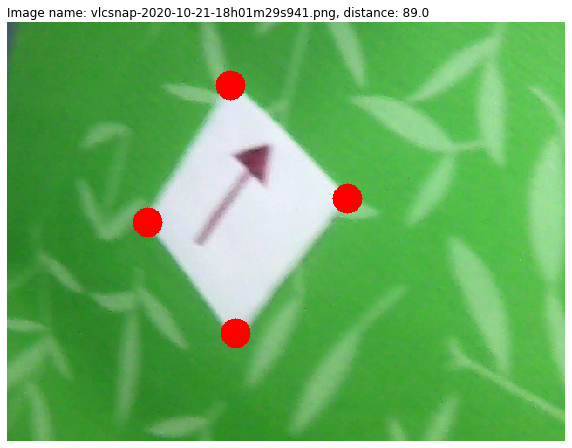

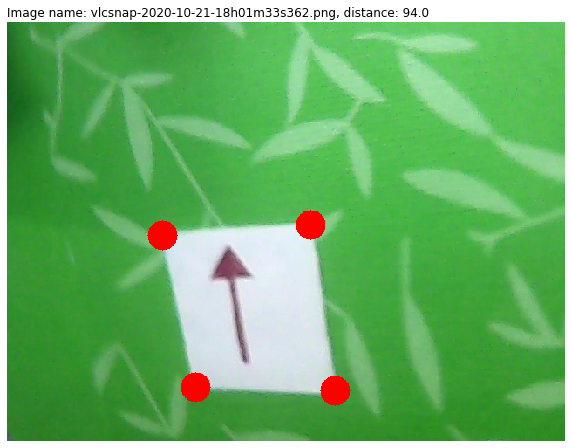

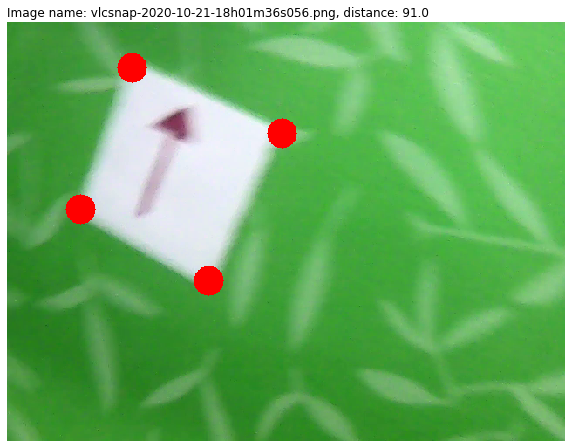

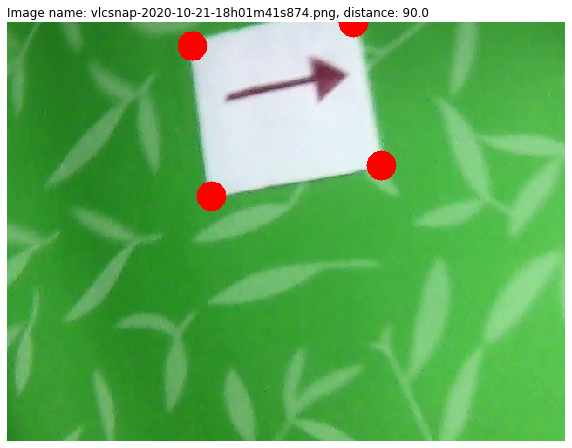

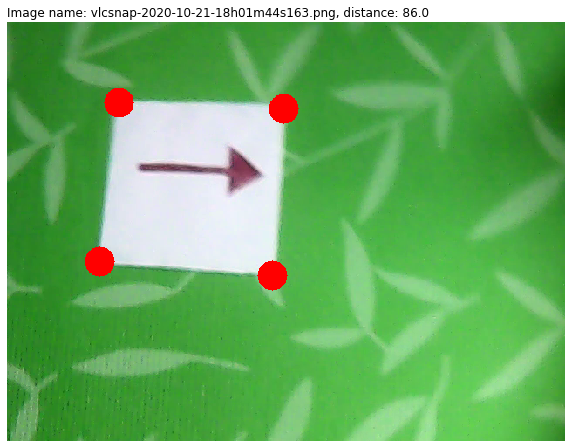

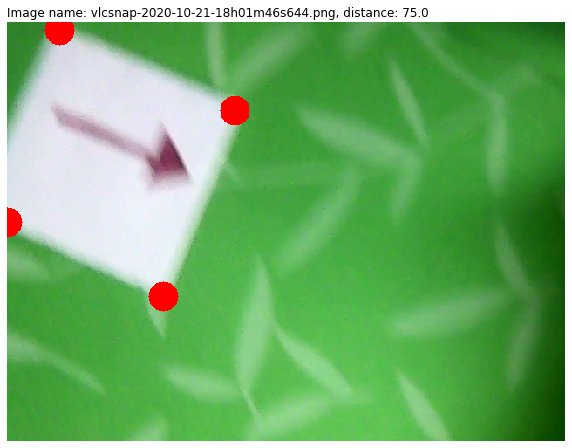

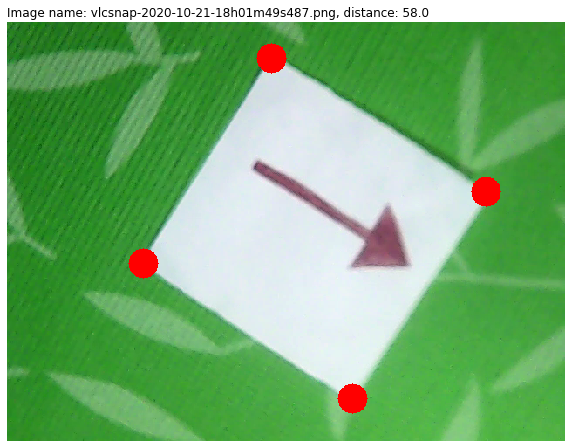

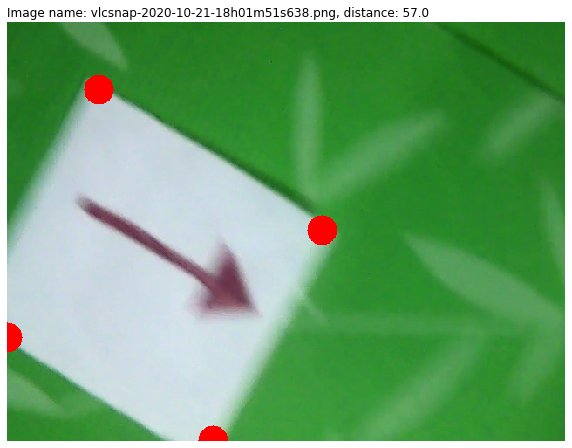

In [ ]:
for img_name in images:
    img = cv2.imread(img_name)
    dist, cnt = find_distance(img)
    contour_marked = cv2.drawContours(img, cnt, -1, (255, 0, 0), 33)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Image name: ' + os.path.basename(img_name) + ', distance: ' + str(round(dist, 0)), loc='left')
    plt.show()

### 2) Реализуйте приведение изображения листка к "виду сверху"

In [ ]:
def order_points(pts):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4, 2), dtype="float32")
    
    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    resh = np.reshape(pts, [4,2])
    s = resh.sum(axis=1)
    rect[0] = resh[np.argmin(s)]
    rect[2] = resh[np.argmax(s)]
    
    new_resh = np.delete(resh, [np.argmin(s), np.argmax(s)], axis=0)

    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(new_resh, axis=1)
    rect[1] = new_resh[np.argmin(diff)]
    rect[3] = new_resh[np.argmax(diff)]
    
    # return the ordered coordinates
    return rect

In [ ]:
def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    
    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    # return the warped image
    return warped

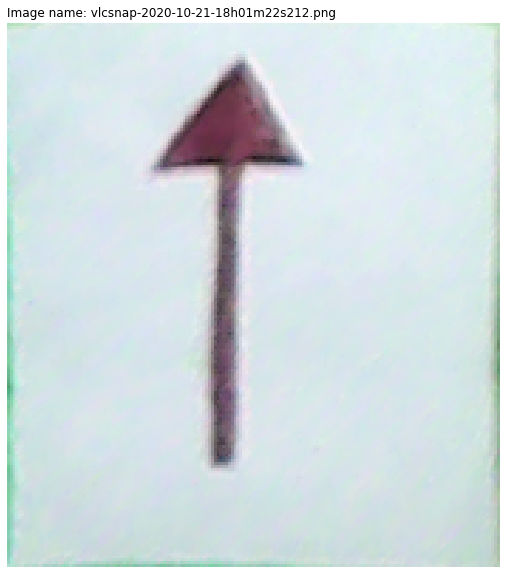

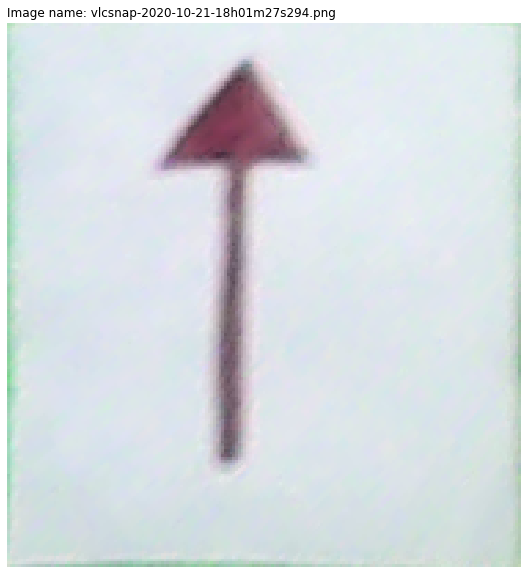

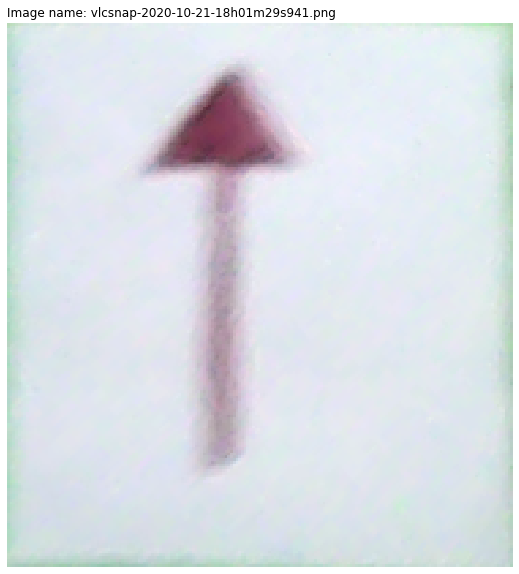

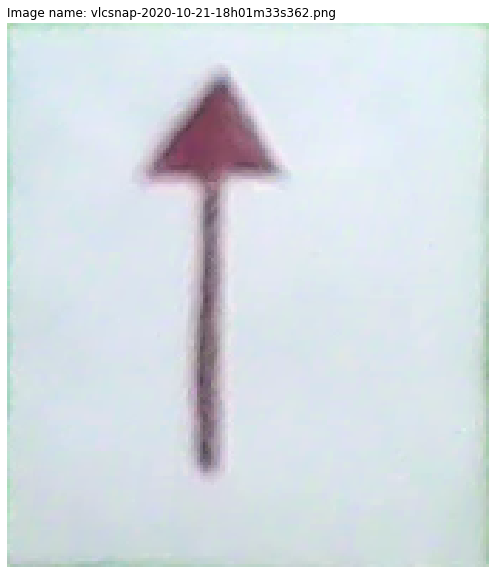

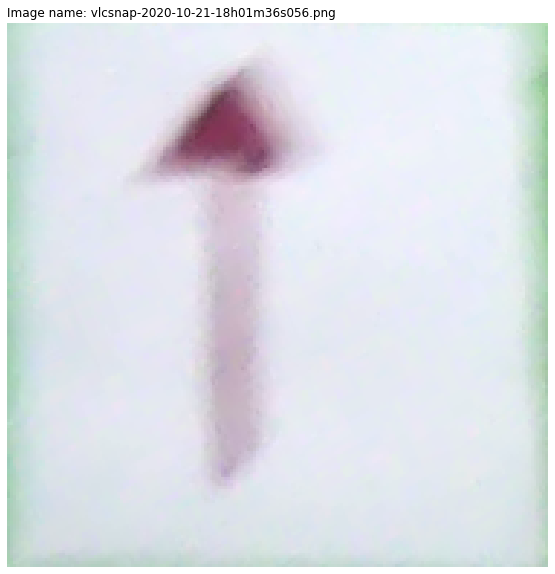

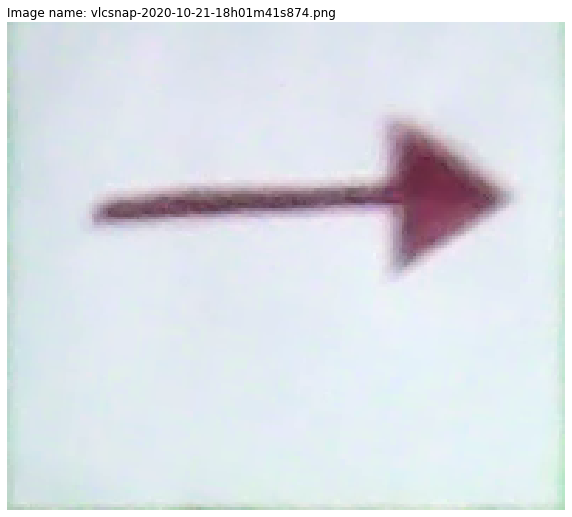

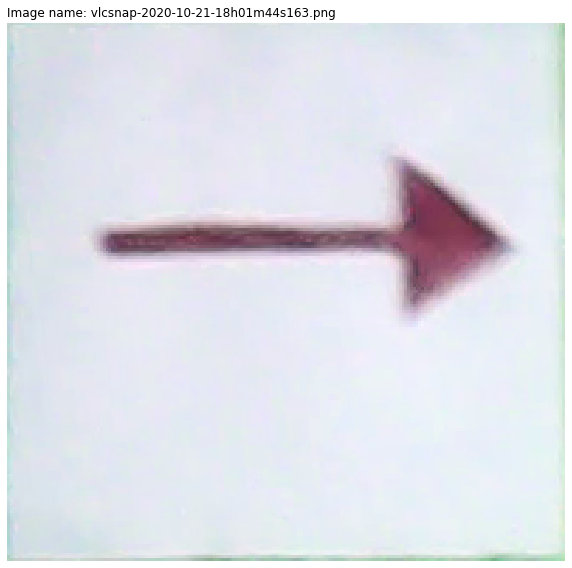

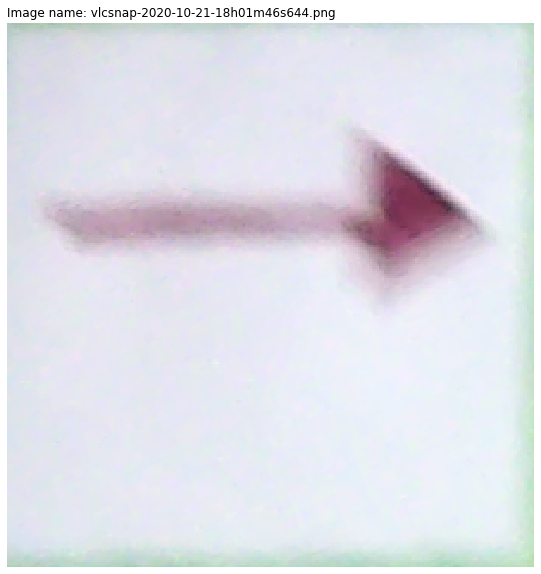

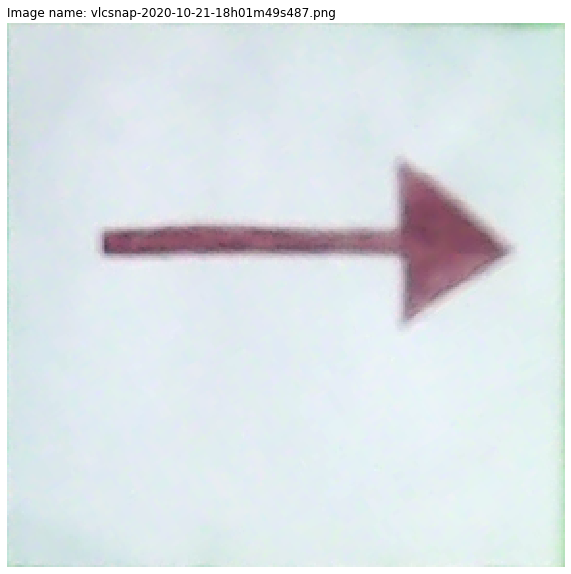

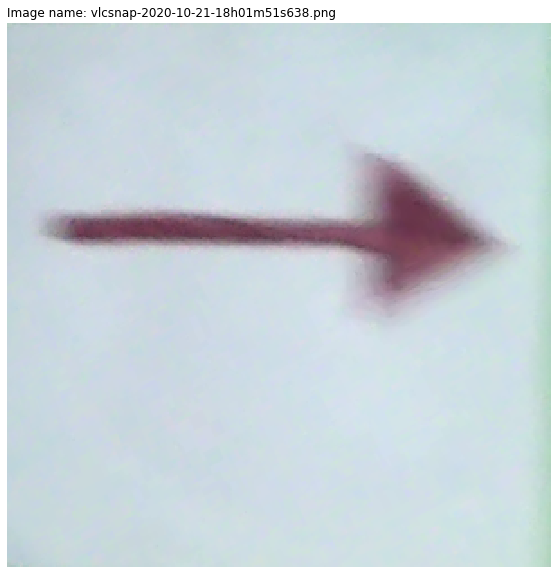

In [ ]:
for img_name in images:
    img = cv2.imread(img_name)
    dist, cnt = find_distance(img)
    warped = four_point_transform(img, np.asarray(cnt)[:, 0, :])
    
    plt.title('Image name: ' + os.path.basename(img_name), loc='left')
    plt.imshow(warped)
    plt.axis('off')
    plt.show()

### 3) Реализуйте определение направления, в котором указывает стрелка

In [ ]:
#определим функцию, более точно считающую порядок точек в контуре
from scipy.spatial import distance as dist
def order_points(pts):
    # sort the points based on their x-coordinates
    pts = np.reshape(pts, [4,2])
    xSorted = pts[np.argsort(pts[:, 0]), :]
    
    # grab the left-most and right-most points from the sorted
    # x-roodinate points
    leftMost = xSorted[:2, :]
    rightMost = xSorted[2:, :]
    
    # now, sort the left-most coordinates according to their
    # y-coordinates so we can grab the top-left and bottom-left
    # points, respectively
    leftMost = leftMost[np.argsort(leftMost[:, 1]), :]
    (tl, bl) = leftMost
    
    # now that we have the top-left coordinate, use it as an
    # anchor to calculate the Euclidean distance between the
    # top-left and right-most points; by the Pythagorean
    # theorem, the point with the largest distance will be
    # our bottom-right point
    D = dist.cdist(tl[np.newaxis], rightMost, "euclidean")[0]
    (br, tr) = rightMost[np.argsort(D)[::-1], :]
    # return the coordinates in top-left, top-right,
    # bottom-right, and bottom-left order
    return np.array([tl, tr, br, bl], dtype="float32")

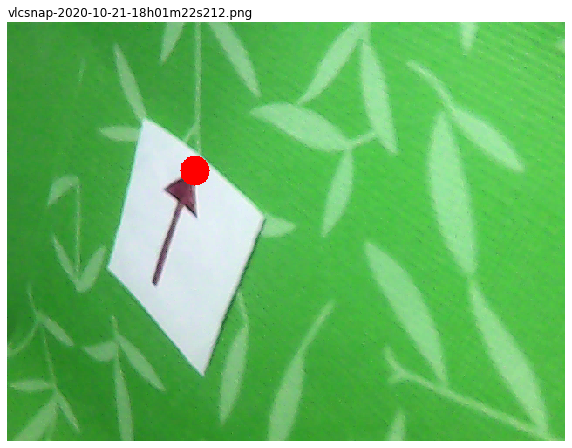

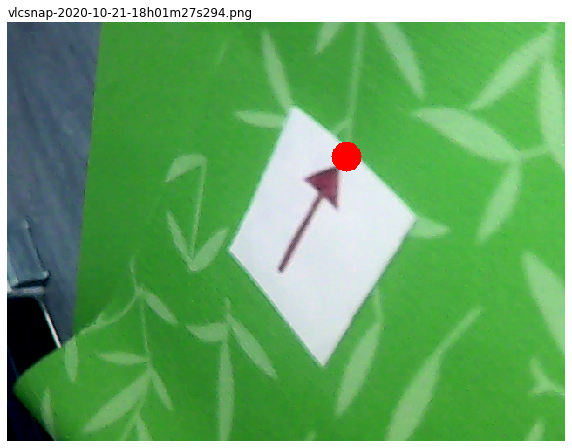

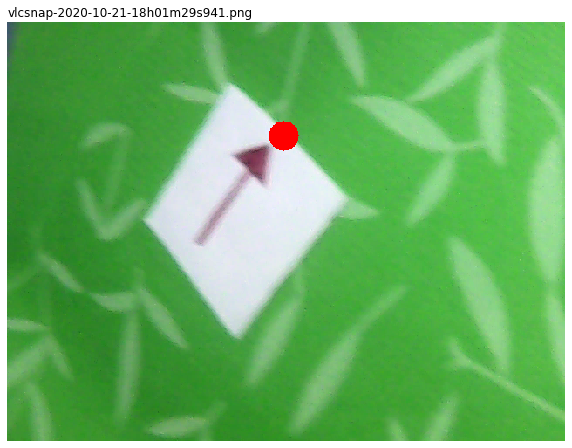

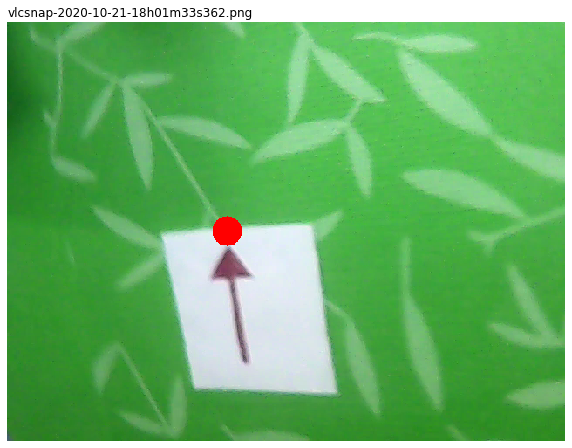

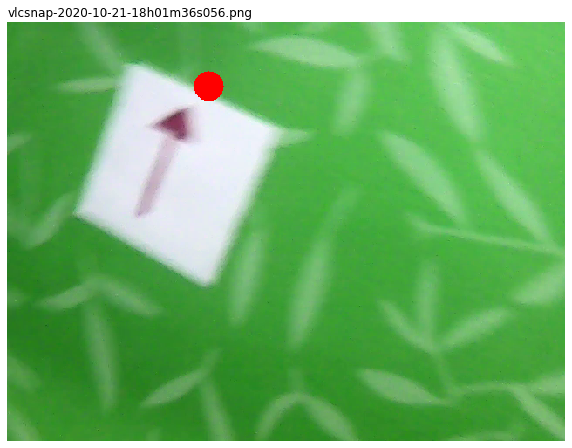

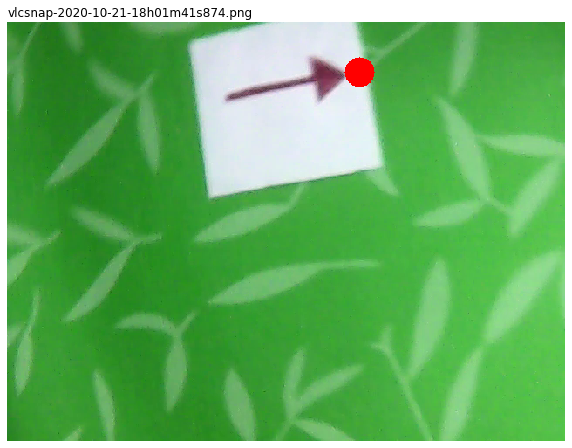

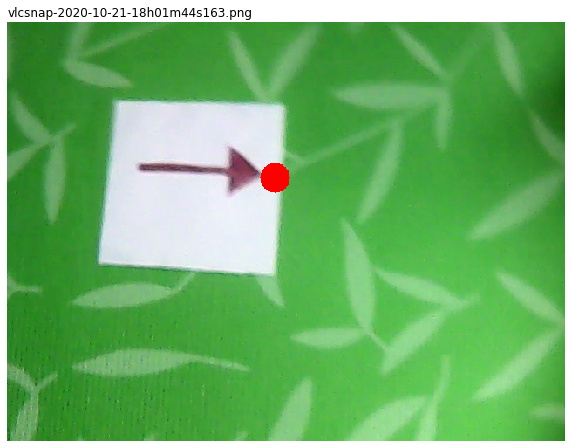

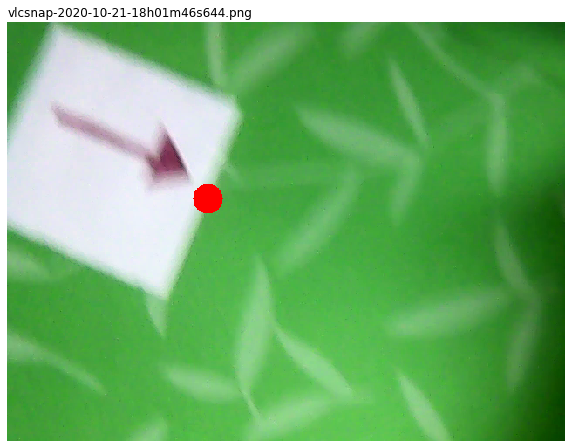

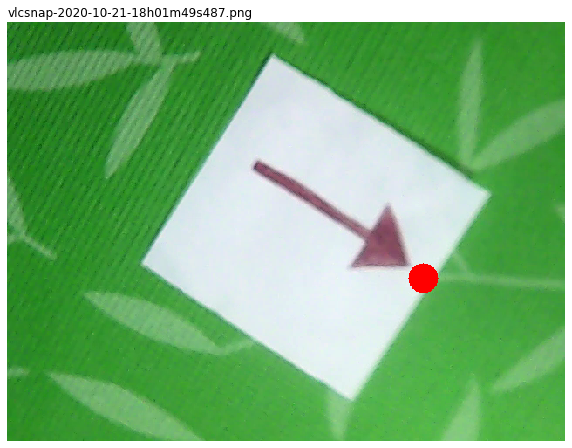

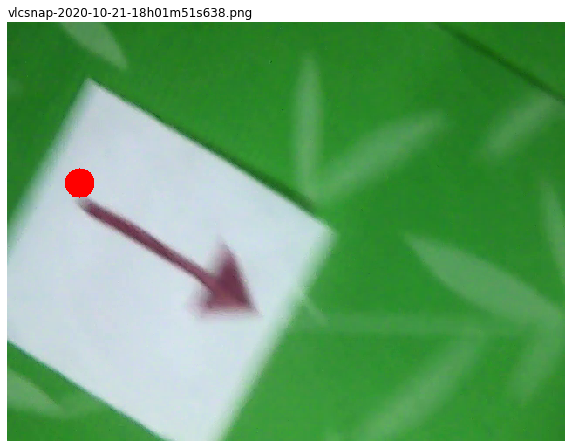

In [ ]:
for img_name in images:
    img = cv2.imread(img_name)

    low_th  = (198, 198, 198)
    high_th = (255, 255, 255)
    
    mask = cv2.inRange(img, low_th, high_th)
    
    mser = cv2.MSER_create()
    regions, _ = mser.detectRegions(mask)
    
    #сделаем из маски изображение
    img_new = np.zeros((480, 640, 3), dtype="float32")
    cv2.drawContours(img_new, regions, -1, (255, 255, 255), 1)
    #и найдем уже на этом изображении четыре угла
    mask = cv2.inRange(img_new, low_th, high_th)
    contours, hierarchy = cv2.findContours (mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    approx = cv2.convexHull(cnt)
    epsilon = 0.05 * cv2.arcLength(approx, True)
    approx = cv2.approxPolyDP(approx, epsilon, True)
    
    #упорядочим точки контура
    ordered = order_points(approx)
    
    #найдём точку пересечения отрезка, соединяющего первую и третью вершины с отрезком, соединяющим вторую и четвертую вершины
    #координаты концов первого отрезка
    x1_1, y1_1 = ordered[0]
    x1_2, y1_2 = ordered[2]
    #координаты концов второго отрезка
    x2_1, y2_1 = ordered[1]
    x2_2, y2_2 = ordered[3]
    
    #точка пересечения
    A1 = y1_1 - y1_2
    B1 = x1_2 - x1_1
    C1 = x1_1*y1_2 - x1_2*y1_1
    A2 = y2_1 - y2_2
    B2 = x2_2 - x2_1
    C2 = x2_1*y2_2 - x2_2*y2_1
     
    y = (C2*A1 - C1*A2) / (B1*A2 - B2*A1)
    x = (-C1 - B1*y) / A1
    intersect_point = np.asarray([x, y], dtype = 'int32')
    
    #найдём точку 'центра масс' стрелки
    center_mass_point = (np.sum(ordered, axis=0) / len(ordered)).astype('int32')
    
    # направление от центра масс до точки пересечения и будет направлением стрелки (метод не сработает, если толстая часть
    # cтрелки будет больше чем ножка)
    point_of_direction = center_mass_point + (intersect_point - center_mass_point) * 4
    point_of_direction = point_of_direction.reshape(1, 1, 2)
    contour_marked = cv2.drawContours(img, point_of_direction, -1, (255, 0, 0), 33)
    plt.imshow(contour_marked)
    plt.axis('off')
    plt.title(os.path.basename(img_name), loc='left')
    plt.show()

### 4) Доп. задача 1: Примените написанный Вами код к видео

In [ ]:
import cv2
from IPython.display import clear_output
import time
import sys
import glob
import numpy as np
import os

from scipy.spatial import distance as dist
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = (10, 10)
%matplotlib inline

In [ ]:
def order_points(pts):
    # sort the points based on their x-coordinates
    pts = np.reshape(pts, [4,2])
    xSorted = pts[np.argsort(pts[:, 0]), :]
    
    # grab the left-most and right-most points from the sorted
    # x-roodinate points
    leftMost = xSorted[:2, :]
    rightMost = xSorted[2:, :]
    
    # now, sort the left-most coordinates according to their
    # y-coordinates so we can grab the top-left and bottom-left
    # points, respectively
    leftMost = leftMost[np.argsort(leftMost[:, 1]), :]
    (tl, bl) = leftMost
    
    # now that we have the top-left coordinate, use it as an
    # anchor to calculate the Euclidean distance between the
    # top-left and right-most points; by the Pythagorean
    # theorem, the point with the largest distance will be
    # our bottom-right point
    D = dist.cdist(tl[np.newaxis], rightMost, "euclidean")[0]
    (br, tr) = rightMost[np.argsort(D)[::-1], :]
    # return the coordinates in top-left, top-right,
    # bottom-right, and bottom-left order
    return np.array([tl, tr, br, bl], dtype="float32")

In [ ]:
def find_contour (img, low_th, high_th):
    mask = cv2.inRange(img, low_th, high_th)
    
    contours, hierarchy = cv2.findContours (mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contoursSorted = sorted(contours, key=lambda x: cv2.contourArea(x), reverse=True)
    cnt = contoursSorted[0]

    approx = cv2.convexHull(cnt)

    epsilon = 0.05 * cv2.arcLength(approx, True)
    approx = cv2.approxPolyDP(approx, epsilon, True)

    return approx

In [ ]:
def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    
    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    # return the warped image
    return warped

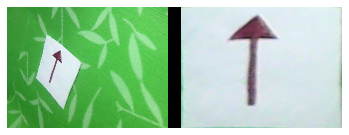

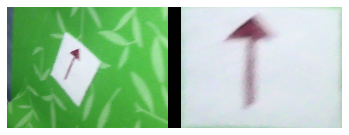

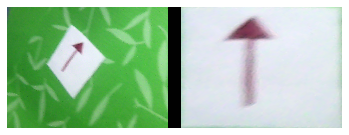

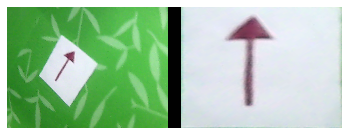

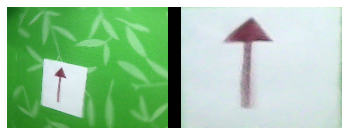

...

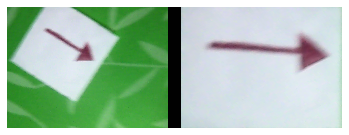

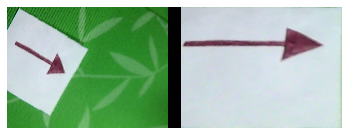

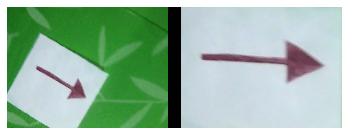

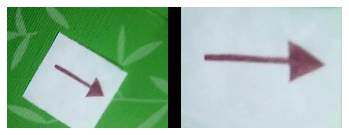

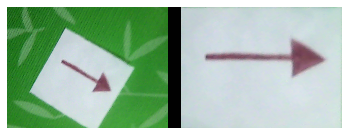

In [ ]:
low_th  = (175, 175, 175)
high_th = (255, 255, 255)

cap = cv2.VideoCapture('../data/video/arrow/original.mov')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('../data/video/arrow/birdseye_view.avi', fourcc, 20.0, (1330, 480))

i = 0
try:
    while(cap.isOpened()):
        ret, img = cap.read()
        if not ret:
            break    
            
        cnt = find_contour(img, low_th, high_th)
        warped = four_point_transform(img, np.asarray(cnt)[:, 0, :])
        
        #combine two images to one frame to write it in file
        h1, w1 = img.shape[0], img.shape[1]
        h2, w2 = warped.shape[0], warped.shape[1]        
        resized_warped = cv2.resize(warped, (w1, h1))
        boundary = np.ones((h1, 50, 3), np.uint8)
        comby = cv2.hconcat([img, boundary, resized_warped])
        
        if i % 10 == 0:
            plt.axis('off')
            plt.imshow(comby)
            plt.show()
        i += 1
        
        out.write(comby)

except KeyboardInterrupt:
    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print("Release Video Resource")

cap.release()
out.release()
cv2.destroyAllWindows()

### 5) Доп. задача 2: определите, нормально ли видно листок в кадре

In [ ]:
import cv2
from IPython.display import clear_output
import time
import sys
import glob
import numpy as np
import os

from scipy.spatial import distance as dist
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = (10, 10)
%matplotlib inline

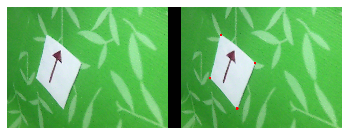

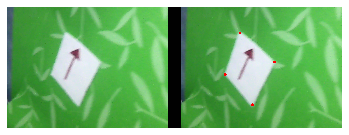

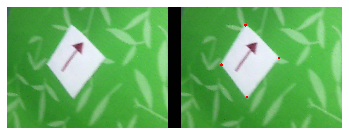

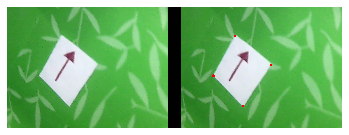

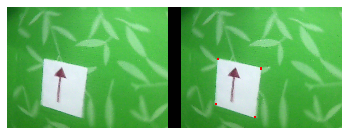

...

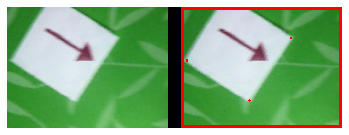

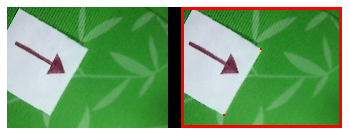

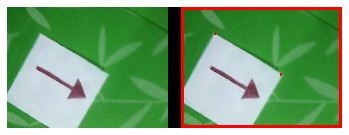

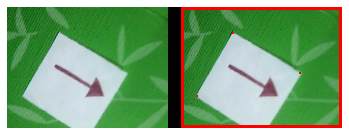

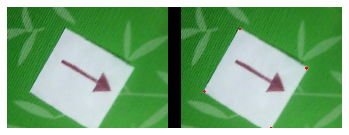

In [ ]:
low_th  = (175, 175, 175)
high_th = (255, 255, 255)

cap = cv2.VideoCapture('../data/video/arrow/original.mov')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('../data/video/arrow/fail_boundary.avi', fourcc, 20.0, (1330, 480))

i = 0
try:
    while(cap.isOpened()):
        ret, img = cap.read()
        if not ret:
            break  
        
        orig_img = img.copy()    
        
        # Определим, выходит ли лист за границы камеры следующим методом:
        # понизим epsilon до значения 0.02, чтобы количество точек, в случае залезания контура за границы
        # увеличилось, и если оно равно 4, то считаем, что лист целиком в кадре, иначе - вышел за границы
        # Так же проверим, не является ли какая-то координата любой точки контура нулевой.
        # Строго говоря, это пограничный случай, но пока не придумал другой алгоритм, буду считать, что это тоже ошибка
        mask = cv2.inRange(img, low_th, high_th)
        contours, hierarchy = cv2.findContours (mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contoursSorted = sorted(contours, key=lambda x: cv2.contourArea(x), reverse=True)
        cnt = contoursSorted[0]
        approx = cv2.convexHull(cnt)
        epsilon = 0.02 * cv2.arcLength(approx, True)
        approx = cv2.approxPolyDP(approx, epsilon, True)
        contour_marked = cv2.drawContours(img, approx, -1, (255, 0, 0), 10)
        
        is_out_of_boundary = False
        if approx.shape[0] != 4:
            is_out_of_boundary = True
        else:
            for point in approx:
                if point[0][0] == 0 or point[0][1] == 0:
                    is_out_of_boundary = True
                    
        if is_out_of_boundary:
            img = cv2.rectangle(img, (0, 0), (640, 480), (255, 0, 0), 20)
        #print(is_out_of_boundary)
        
        #combine two images to one frame to write it in file
        boundary = np.ones((480, 50, 3), np.uint8)
        comby = cv2.hconcat([orig_img, boundary, img])
        
        if i % 10 == 0:
            plt.axis('off')
            plt.imshow(comby)
            plt.show()
        
        i += 1
        #out.write(comby)

except KeyboardInterrupt:
    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print("Release Video Resource")

cap.release()
out.release()
cv2.destroyAllWindows()